In [96]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

In [97]:
data = pd.read_csv('cmc.data')

In [98]:
data.head()

,24,2,3,3.1,1,1.1,2.1,3.2,0,1.2
0,45,1,3,10,1,1,3,4,0,1
1,43,2,3,7,1,1,3,4,0,1
2,42,3,2,9,1,1,3,3,0,1
3,36,3,3,8,1,1,3,2,0,1
4,19,4,4,0,1,1,3,3,0,1


In [99]:
df = data 

In [100]:
df.columns=['age','wife_education','husband_education','no_children',
            'religion', 'working', 'husband_occupation','std_index','media_exposure',
           'contraceptive_method']

In [101]:
df.head()

,age,wife_education,husband_education,no_children,religion,working,husband_occupation,std_index,media_exposure,contraceptive_method
0,45,1,3,10,1,1,3,4,0,1
1,43,2,3,7,1,1,3,4,0,1
2,42,3,2,9,1,1,3,3,0,1
3,36,3,3,8,1,1,3,2,0,1
4,19,4,4,0,1,1,3,3,0,1


In [102]:
df.dtypes

age                     int64
wife_education          int64
husband_education       int64
no_children             int64
religion                int64
working                 int64
husband_occupation      int64
std_index               int64
media_exposure          int64
contraceptive_method    int64
dtype: object

In [103]:

##Practice
from sklearn.feature_extraction import DictVectorizer

data = [
    {'color': 'red', 'size': 'small'},
    {'color': 'blue', 'size': 'large'},
    {'color': 'green', 'size': 'medium'}
]

# Create an instance of DictVectorizer
vectorizer = DictVectorizer()

# Fit the vectorizer on the data and transform it
X = vectorizer.fit_transform(data)

# Convert the transformed data to an array
X_array = X.toarray()

# Get the feature names
feature_names = vectorizer.get_feature_names()

# Print the transformed data and feature names
print(X_array)
print(feature_names)

[[0. 0. 1. 0. 0. 1.]
 [1. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 1. 0.]]
['color=blue', 'color=green', 'color=red', 'size=large', 'size=medium', 'size=small']


In [104]:
wife_education_mapping ={1:"low", 2:"medium-low", 3:"medium-high", 4:"high"}
husband_education_mapping = {1:"low", 2:"medium-low", 3:"medium-high", 4:"high"}
religion_mapping ={0:"Non-Islam", 1:"Islam"}
working_mapping={0:"Yes", 1:"No"}
husband_occupation_mapping ={1:"low", 2:"medium-low", 3:"medium-high", 4:"high"}
std_index_mapping ={1:"low", 2:"medium-low", 3:"medium-high", 4:"high"}
media_exposure_mapping = {0:"Good", 1:"Not good"}
#contraceptive_method_mapping ={1:"No use", 2:"Long term", 3:"Short term"}

In [105]:
df['wife_education_label'] = df['wife_education'].map(wife_education_mapping)
df['husband_education_label'] = df['husband_education'].map(husband_education_mapping)
df['religion_label'] = df['religion'].map(religion_mapping)
df['working_label'] = df['working'].map(working_mapping)
df['husband_occupation_label'] = df['husband_occupation'].map(husband_occupation_mapping)
df['std_index_label'] = df['std_index'].map(std_index_mapping)
df['media_exposure_label'] = df['media_exposure'].map(media_exposure_mapping)
#df['contraceptive_method_label'] = df['contraceptive_method'].map(contraceptive_method_mapping)


In [106]:
df.head()

,age,wife_education,husband_education,no_children,religion,working,husband_occupation,std_index,media_exposure,contraceptive_method,wife_education_label,husband_education_label,religion_label,working_label,husband_occupation_label,std_index_label,media_exposure_label
0,45,1,3,10,1,1,3,4,0,1,low,medium-high,Islam,No,medium-high,high,Good
1,43,2,3,7,1,1,3,4,0,1,medium-low,medium-high,Islam,No,medium-high,high,Good
2,42,3,2,9,1,1,3,3,0,1,medium-high,medium-low,Islam,No,medium-high,medium-high,Good
3,36,3,3,8,1,1,3,2,0,1,medium-high,medium-high,Islam,No,medium-high,medium-low,Good
4,19,4,4,0,1,1,3,3,0,1,high,high,Islam,No,medium-high,medium-high,Good


In [107]:
new_df = df[['age','wife_education_label','husband_education_label','no_children','religion_label','working_label',
             'husband_occupation_label','std_index_label','media_exposure_label','contraceptive_method']]

In [1]:
new_df['contraceptive_method_label']= new_df['contraceptive_method'].astype('category')

NameError: name 'new_df' is not defined

In [109]:
new_df.head()

,age,wife_education_label,husband_education_label,no_children,religion_label,working_label,husband_occupation_label,std_index_label,media_exposure_label,contraceptive_method,contraceptive_method_label
0,45,low,medium-high,10,Islam,No,medium-high,high,Good,1,1
1,43,medium-low,medium-high,7,Islam,No,medium-high,high,Good,1,1
2,42,medium-high,medium-low,9,Islam,No,medium-high,medium-high,Good,1,1
3,36,medium-high,medium-high,8,Islam,No,medium-high,medium-low,Good,1,1
4,19,high,high,0,Islam,No,medium-high,medium-high,Good,1,1


In [110]:
new_df.dtypes

age                              int64
wife_education_label            object
husband_education_label         object
no_children                      int64
religion_label                  object
working_label                   object
husband_occupation_label        object
std_index_label                 object
media_exposure_label            object
contraceptive_method             int64
contraceptive_method_label    category
dtype: object

In [111]:
new_df = new_df.drop('contraceptive_method', axis=1)

In [112]:
new_df.dtypes

age                              int64
wife_education_label            object
husband_education_label         object
no_children                      int64
religion_label                  object
working_label                   object
husband_occupation_label        object
std_index_label                 object
media_exposure_label            object
contraceptive_method_label    category
dtype: object

In [113]:
new_df['wife_education_label'].unique()

array(['low', 'medium-low', 'medium-high', 'high'], dtype=object)

In [114]:
##OneHotEncode new_df
cols = ['wife_education_label','husband_education_label','religion_label','working_label',
        'husband_occupation_label','std_index_label','media_exposure_label']

transformer = make_column_transformer((OneHotEncoder(),['wife_education_label','husband_education_label','religion_label','working_label',
                      'husband_occupation_label','std_index_label','media_exposure_label']), remainder = 'passthrough')

In [115]:
transformed = transformer.fit_transform(new_df)

In [116]:
transformed_new_df = pd.DataFrame(transformed, columns = transformer.get_feature_names())

In [117]:
print(transformed_new_df.head())

   onehotencoder__x0_high  onehotencoder__x0_low  \
0                     0.0                    1.0   
1                     0.0                    0.0   
2                     0.0                    0.0   
3                     0.0                    0.0   
4                     1.0                    0.0   

   onehotencoder__x0_medium-high  onehotencoder__x0_medium-low  \
0                            0.0                           0.0   
1                            0.0                           1.0   
2                            1.0                           0.0   
3                            1.0                           0.0   
4                            0.0                           0.0   

   onehotencoder__x1_high  onehotencoder__x1_low  \
0                     0.0                    0.0   
1                     0.0                    0.0   
2                     0.0                    0.0   
3                     0.0                    0.0   
4                     1.0     

In [118]:
transformed_new_df.dtypes

onehotencoder__x0_high           float64
onehotencoder__x0_low            float64
onehotencoder__x0_medium-high    float64
onehotencoder__x0_medium-low     float64
onehotencoder__x1_high           float64
onehotencoder__x1_low            float64
onehotencoder__x1_medium-high    float64
onehotencoder__x1_medium-low     float64
onehotencoder__x2_Islam          float64
onehotencoder__x2_Non-Islam      float64
onehotencoder__x3_No             float64
onehotencoder__x3_Yes            float64
onehotencoder__x4_high           float64
onehotencoder__x4_low            float64
onehotencoder__x4_medium-high    float64
onehotencoder__x4_medium-low     float64
onehotencoder__x5_high           float64
onehotencoder__x5_low            float64
onehotencoder__x5_medium-high    float64
onehotencoder__x5_medium-low     float64
onehotencoder__x6_Good           float64
onehotencoder__x6_Not good       float64
age                              float64
no_children                      float64
contraceptive_me

In [119]:
#transformed_new_df['contraceptive_method_label2']= transformed_new_df['contraceptive_method_label'].astype('category')
transformed_new_df[['age_2','no_children_2']]= transformed_new_df[['age','no_children']].astype('int')

In [120]:
transformed_new_df.dtypes

onehotencoder__x0_high           float64
onehotencoder__x0_low            float64
onehotencoder__x0_medium-high    float64
onehotencoder__x0_medium-low     float64
onehotencoder__x1_high           float64
onehotencoder__x1_low            float64
onehotencoder__x1_medium-high    float64
onehotencoder__x1_medium-low     float64
onehotencoder__x2_Islam          float64
onehotencoder__x2_Non-Islam      float64
onehotencoder__x3_No             float64
onehotencoder__x3_Yes            float64
onehotencoder__x4_high           float64
onehotencoder__x4_low            float64
onehotencoder__x4_medium-high    float64
onehotencoder__x4_medium-low     float64
onehotencoder__x5_high           float64
onehotencoder__x5_low            float64
onehotencoder__x5_medium-high    float64
onehotencoder__x5_medium-low     float64
onehotencoder__x6_Good           float64
onehotencoder__x6_Not good       float64
age                              float64
no_children                      float64
contraceptive_me

In [121]:
#transformed_new_df['contraceptive_method_label2']= transformed_new_df['contraceptive_method_label'].astype('category')

In [122]:
transformed_new_df = transformed_new_df.drop(['age','no_children'],axis=1)#,'contraceptive_method_label'], axis=1)

In [123]:
transformed_new_df.dtypes

onehotencoder__x0_high           float64
onehotencoder__x0_low            float64
onehotencoder__x0_medium-high    float64
onehotencoder__x0_medium-low     float64
onehotencoder__x1_high           float64
onehotencoder__x1_low            float64
onehotencoder__x1_medium-high    float64
onehotencoder__x1_medium-low     float64
onehotencoder__x2_Islam          float64
onehotencoder__x2_Non-Islam      float64
onehotencoder__x3_No             float64
onehotencoder__x3_Yes            float64
onehotencoder__x4_high           float64
onehotencoder__x4_low            float64
onehotencoder__x4_medium-high    float64
onehotencoder__x4_medium-low     float64
onehotencoder__x5_high           float64
onehotencoder__x5_low            float64
onehotencoder__x5_medium-high    float64
onehotencoder__x5_medium-low     float64
onehotencoder__x6_Good           float64
onehotencoder__x6_Not good       float64
contraceptive_method_label       float64
age_2                              int32
no_children_2   

In [124]:
transformed_new_df.head()

,onehotencoder__x0_high,onehotencoder__x0_low,onehotencoder__x0_medium-high,onehotencoder__x0_medium-low,onehotencoder__x1_high,onehotencoder__x1_low,onehotencoder__x1_medium-high,onehotencoder__x1_medium-low,onehotencoder__x2_Islam,onehotencoder__x2_Non-Islam,...,onehotencoder__x4_medium-low,onehotencoder__x5_high,onehotencoder__x5_low,onehotencoder__x5_medium-high,onehotencoder__x5_medium-low,onehotencoder__x6_Good,onehotencoder__x6_Not good,contraceptive_method_label,age_2,no_children_2
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,45,10
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,43,7
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,42,9
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,36,8
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,19,0


In [125]:
import plotly.express as px

import matplotlib.pyplot as plt

import seaborn as sns
sns.set(style = "whitegrid", 
        color_codes = True,
        font_scale = 1.5)

In [126]:
## Correlation between variables and Contraceptive use
correlation = transformed_new_df.corr()
corr = abs(correlation['contraceptive_method_label'])

#Selecting high correlating features
co_features =corr[corr>0.1]
co_features.drop(labels = ['contraceptive_method_label'], inplace=True)
co_features.sort_values(ascending=False, inplace=True)
co_features

age_2                         0.163814
onehotencoder__x0_low         0.129759
onehotencoder__x6_Not good    0.119456
onehotencoder__x6_Good        0.119456
onehotencoder__x1_low         0.111582
onehotencoder__x0_high        0.104618
Name: contraceptive_method_label, dtype: float64

<ipython-input-127-9e87ed3b7944>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sns.heatmap(correlation, mask=np.zeros_like(correlation, dtype=np.bool), cmap="RdBu_r",


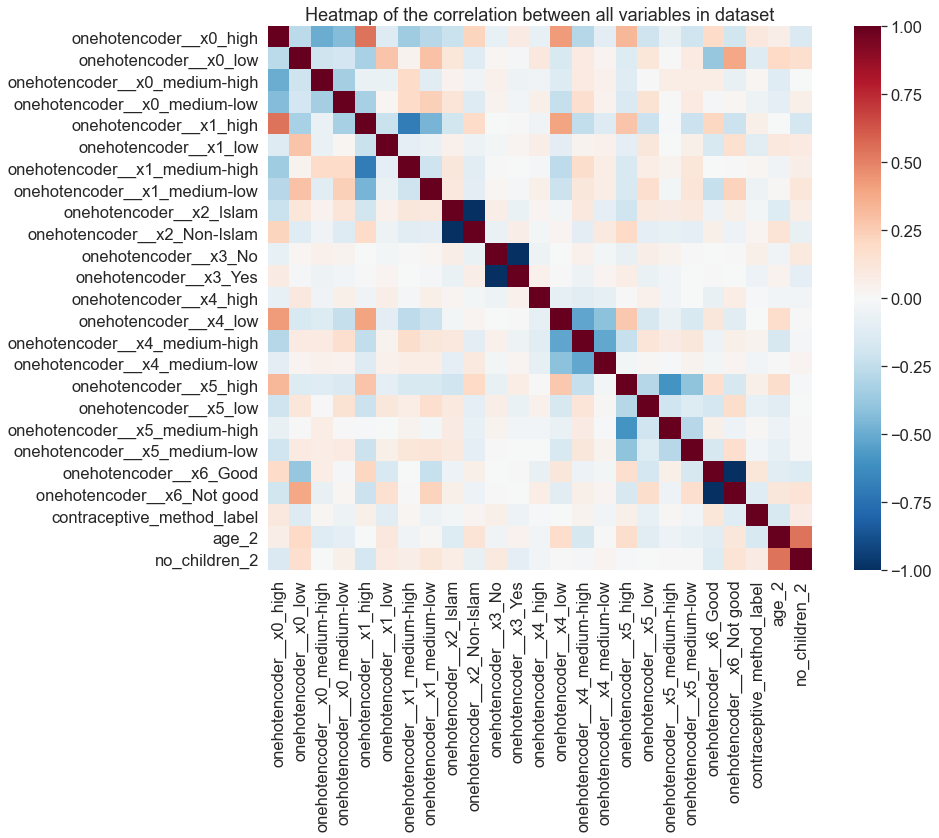

In [127]:
f, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(correlation, mask=np.zeros_like(correlation, dtype=np.bool), cmap="RdBu_r",
            square=True, ax=ax)
plt.title("Heatmap of the correlation between all variables in dataset")
plt.show();

In [128]:
new_df['contraceptive_method_label']= new_df['contraceptive_method_label'].astype('int')
new_df[['wife_education_label','husband_education_label','religion_label','working_label',
        'husband_occupation_label','std_index_label','media_exposure_label']] = new_df [['wife_education_label','husband_education_label','religion_label','working_label',
        'husband_occupation_label','std_index_label','media_exposure_label']].astype(str)
new_df.dtypes
transformed_new_df.dtypes

onehotencoder__x0_high           float64
onehotencoder__x0_low            float64
onehotencoder__x0_medium-high    float64
onehotencoder__x0_medium-low     float64
onehotencoder__x1_high           float64
onehotencoder__x1_low            float64
onehotencoder__x1_medium-high    float64
onehotencoder__x1_medium-low     float64
onehotencoder__x2_Islam          float64
onehotencoder__x2_Non-Islam      float64
onehotencoder__x3_No             float64
onehotencoder__x3_Yes            float64
onehotencoder__x4_high           float64
onehotencoder__x4_low            float64
onehotencoder__x4_medium-high    float64
onehotencoder__x4_medium-low     float64
onehotencoder__x5_high           float64
onehotencoder__x5_low            float64
onehotencoder__x5_medium-high    float64
onehotencoder__x5_medium-low     float64
onehotencoder__x6_Good           float64
onehotencoder__x6_Not good       float64
contraceptive_method_label       float64
age_2                              int32
no_children_2   

<Figure size 1440x1440 with 0 Axes>

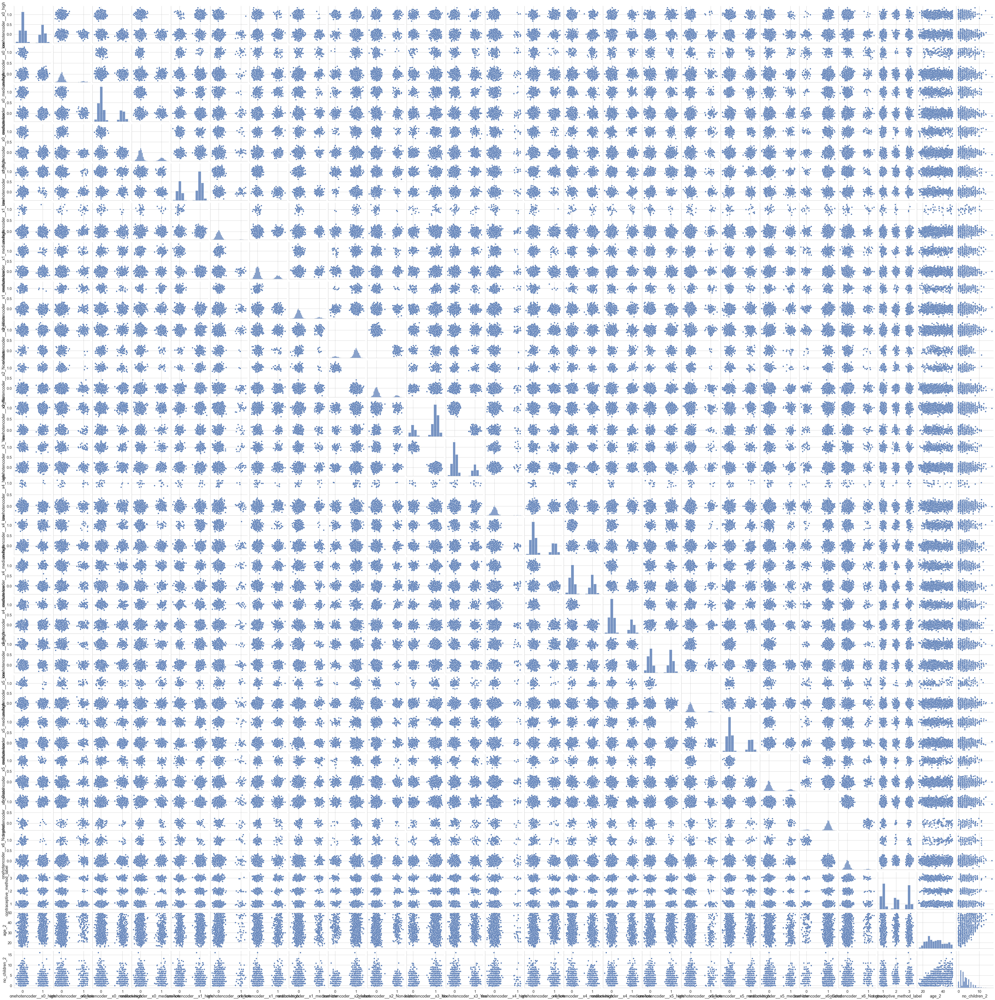

In [129]:
plt.figure(figsize = (20, 20))
sns.pairplot(transformed_new_df + np.random.normal(0, 0.1, size = (len(transformed_new_df), 25)))
plt.show();

In [130]:
plt.figure(figsize = (20, 20))
sns.pairplot(new_df + np.random.normal(0, 0.1, size = (len(new_df), 10)))
plt.show();

TypeError: can only concatenate str (not "float") to str

<Figure size 1440x1440 with 0 Axes>

In [ ]:
no_use = np.count_nonzero(transformed_new_df['contraceptive_method_label']==1)
long_term = np.count_nonzero(transformed_new_df['contraceptive_method_label']==2)
short_term = np.count_nonzero(transformed_new_df['contraceptive_method_label']==3)

print("There are", no_use, "women not using contraceptives.")
print("There are", long_term, "women using short_term contraceptives.")
print("There are", short_term, "women using long-term contraceptives.")

plt.figure(figsize=(10,6))
sns.countplot(x='contraceptive_method_label',data=transformed_new_df)
plt.xlabel("Contraceptive Methods")
plt.title("Number of women using each type of contraceptives")
plt.ylabel("Number of women")
plt.show();

In [132]:
#Pivot table based on counts between contraceptions and quality of living
contra_labeled = transformed_new_df.copy(deep=True)
replace_val(contra_labeled, ["contraceptive_method_label"], [1, 2, 3], ["No-use", "Long-term", "Short-term"])
contra_QOL = contra_labeled[["std_index_label", "contraceptive_method_label"]]

pivot_contra = contra_QOL.pivot_table(index = 'std_index_label', columns = 'contraceptive_method_label', aggfunc='size')

#Percentage of popularity of the methods in each SOL
pivot_propSOL = pd.DataFrame(columns = ['Long-term', 'No-use', 'Short-term'], 
                             index = ['Low', 'Med-Low', 'Medium', 'High'])
pivot_propSOL.iloc[0] = pivot_contra.iloc[0].values/sum(pivot_contra.iloc[0].values)
pivot_propSOL.iloc[1] = pivot_contra.iloc[1].values/sum(pivot_contra.iloc[1].values)
pivot_propSOL.iloc[2] = pivot_contra.iloc[2].values/sum(pivot_contra.iloc[2].values)
pivot_propSOL.iloc[3] = pivot_contra.iloc[3].values/sum(pivot_contra.iloc[3].values)


NameError: name 'replace_val' is not defined

In [ ]:
inputs = transformed_new_df.drop('contraceptive_method_label', axis='columns')
target = transformed_new_df['contraceptive_method_label']
inputs.head(5)

In [ ]:
target.head(5)

In [ ]:
from sklearn.model_selection import train_test_split
X = inputs
y = target
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [ ]:
clf.get_params()

In [ ]:
predictions = clf.predict(X_test)
predictions

In [ ]:
clf.predict_proba(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions)

In [ ]:
clf.score(inputs,target)

In [ ]:
new_df.head(5)

In [ ]:
inputs_2 = new_df.drop('contraceptive_method_label', axis='columns')
target_2 = new_df['contraceptive_method_label']

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
wife_education_label1 = LabelEncoder()
husband_education_label1 = LabelEncoder()
religion_label1 = LabelEncoder()
working_label1 = LabelEncoder()
husband_occupation_label1 = LabelEncoder()
std_index_label1 = LabelEncoder()
media_exposure_label1 = LabelEncoder()

In [ ]:
inputs_2['wife_education_label1']= wife_education_label1.fit_transform(inputs_2['wife_education_label'])
inputs_2['husband_education_label1']= husband_education_label1.fit_transform(inputs_2['husband_education_label'])
inputs_2['religion_label1']= religion_label1.fit_transform(inputs_2['religion_label'])
inputs_2['working_label1']= working_label1.fit_transform(inputs_2['working_label'])
inputs_2['husband_occupation_label1']= husband_occupation_label1.fit_transform(inputs_2['husband_occupation_label'])
inputs_2['std_index_label1']=std_index_label1.fit_transform(inputs_2['std_index_label'])
inputs_2['media_exposure_label1']= media_exposure_label1.fit_transform(inputs_2['media_exposure_label'])
inputs_2.head(5)

In [ ]:
inputs_n = inputs_2.drop(['wife_education_label','husband_education_label','religion_label',
                         'working_label','husband_occupation_label','std_index_label',
                         'media_exposure_label'],axis='columns')
inputs_n.head(5)

In [ ]:
inputs_n.dtypes

In [ ]:
from sklearn.model_selection import train_test_split
X = inputs_n
y = target_2
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions)

In [ ]:
clf.score(inputs_n,target_2)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions, target_names=['Nou use','Long term','Short term']))